In [ ]:
import numpy.typing as npt
import LS_Functions as lsf
import aicspylibczi as czi
import numpy as np
import math
import sys

from matplotlib import pyplot as plt
from matplotlib.axes import Axes
from matplotlib.figure import Figure
from skimage.util import img_as_float
from fast_histogram import histogram2d, histogram1d
from scipy.optimize import fmin_cobyla
from skimage.transform import downscale_local_mean
from skimage.util import img_as_float
from tqdm import tqdm

def shannon_entropy(a: npt.NDArray) -> float:
    """
    This runs very often, so we should do our best to make this fast.
    See 'profiling/shannon-entropy.ipynb' for why this was chosen
    """
    # seems like flattened arrays are faster, but .flatten() produces a copy so we
    # stick with .ravel()
    a = a.ravel()
    a /= a.sum()
    a = a[np.nonzero(a != 0)]
    a *= np.log2(a)
    return -a.sum().item()
def mutual_information(x: npt.NDArray, y: npt.NDArray, *, bins=100) -> float:
    try:
        x = x.ravel()
        y = y.ravel()

        x_range = (x.min(), x.max())
        y_range = (y.min(), y.max())

        # TODO: even though fast-histogram is pretty dang fast, consider boost-histogram?
        #  measure perf diff
        c_xy = histogram2d(x, y, bins, (x_range, y_range))
        c_x = histogram1d(x, bins, x_range)
        c_y = histogram1d(y, bins, y_range)

        h_xy = shannon_entropy(c_xy)
        h_x = shannon_entropy(c_x)
        h_y = shannon_entropy(c_y)
    except:
        print('something wrong!')
        h_x = 100
        h_y = 100
        h_xy = 100
    return h_x + h_y - h_xy
def regional_mi(x: npt.NDArray, y: npt.NDArray) -> float:
    """
    FIXME not optimized, but doesn't give us better results than regular mi, so not
     worth it at the moment
    """
    x = np.copy(x)
    y = np.copy(y)

    x /= x.max()
    y /= y.max()

    r = 1

    stack = []
    for ri in range(2 * r):
        for rj in range(2 * r):
            stack.append(x[ri : -2 * r + ri, rj : -2 * r + rj])
    for ri in range(2 * r):
        for rj in range(2 * r):
            stack.append(y[ri : -2 * r + ri, rj : -2 * r + rj])
    stack = np.stack(stack)
    stack = np.reshape(stack, (stack.shape[0], -1))

    dim, n_points = stack.shape[:2]
    hdim = dim // 2

    mean = np.mean(stack, axis=1, keepdims=True)
    stack -= mean
    cov = stack @ stack.T / n_points
    h_xy = math.log(np.linalg.det(cov))
    h_x = math.log(np.linalg.det(cov[:hdim, :hdim]))
    h_y = math.log(np.linalg.det(cov[hdim:, hdim:]))
    return h_x + h_y - h_xy
def minimize_mi(x: npt.NDArray, y: npt.NDArray, *, init_alpha=0.0) -> float:
    def func(alpha: npt.NDArray):
        return mutual_information(x, y - alpha * x)

    result: npt.NDArray = fmin_cobyla(
        func=func,
        x0=np.array([init_alpha]),
        cons=[lambda a: a],
        rhobeg=1e-2,
        rhoend=1e-8,
    )
    return result.item()
def compute_unmixing_matrix(
    image: npt.NDArray,
    *,
    max_iters=1000,
    step_mult=0.1,
    verbose=False,
    return_iters=False,
) -> npt.NDArray:
    assert image.ndim == 3  # CYX
    n_channels = image.shape[0]

    image = img_as_float(image)
    image_orig = image.copy()

    mat_cumul = np.eye(n_channels, dtype=float)
    mat_last = np.eye(n_channels, dtype=float)

    mats = []
    for _ in tqdm(
        range(max_iters),
        disable=not verbose,
        desc="Unmixing iterations",
        total=0,
        file=sys.stdout,
    ):
        mat = np.eye(n_channels, dtype=float)

        for row in range(n_channels):
            for col in range(n_channels):
                if row == col:
                    continue

                coef = minimize_mi(
                    image[col], image[row], init_alpha=mat_last[row, col]
                )
                mat[row, col] = -step_mult * coef

        # check this early on
        if np.allclose(mat, mat_last):
            break
        mat_last = mat.copy()

        # update matrix
        assert mat_cumul.shape == (n_channels, n_channels)
        mat_cumul = mat @ mat_cumul

        # constrain coefficients to 1.0 along the diagonal, and negative for
        # off-diagonal entries
        for row in range(n_channels):
            for col in range(n_channels):
                if row == col:
                    mat_cumul[row, col] = 1.0
                else:
                    if mat_cumul[row, col] > 0.0:
                        mat_cumul[row, col] = 0.0
        mats.append(mat_cumul.copy())

        # update the next iteration of image
        assert mat_cumul.shape == (n_channels, n_channels)
        assert image.ndim == 3
        # several times faster than np.einsum
        image = np.tensordot(mat_cumul, image_orig, axes=1)

    if return_iters:
        return np.stack(mats)
    else:
        return mats[-1]
def generate_equally_spaced_n_dim_points(N_comp, modulation=0.95):
    """
    Generates N_comp N_comp-dimensional points equally spaced in phase.

    Args:
        N_comp (int): The number of points and the dimensionality.
        modulation (float): The modulation value, which must be < 1.

    Returns:
        np.ndarray: An array of shape (N_comp, N_comp) containing the points.
    """
    if not 0 < modulation < 1:
        raise ValueError("Modulation must be between 0 and 1.")

    # Create an array to hold all the points
    points = np.zeros((N_comp, N_comp))

    # Calculate the phase for each point
    phases = (2 * np.pi * np.arange(N_comp)) / N_comp

    # A phase offset for each dimension to ensure equal spacing in the N-dim space
    # This is a key part of the corrected approach.
    dim_phase_offset = (2 * np.pi * np.arange(N_comp)) / N_comp

    for i in range(N_comp):
        for j in range(N_comp):
            # Calculate each coordinate for point 'i'
            # The coordinate is determined by its phase and a unique dimensional offset
            points[i, j] = modulation * np.cos(phases[i] + dim_phase_offset[j])
            
    return points

def compute_unmixing_matrix_phasor(img_spectral,N_comp):
    coord = np.zeros_like(img_spectral)[:N_comp]
    for i in range(N_comp):
        if i % 2 == 0: 
            n_harmonic = (i // 2) + 1
            g, s, ph, m = lsf.PhasorTransform_Slow_3D(img_spectral, axis=0, n_harmonic=n_harmonic)
            coord[i] = g
        else: 
            coord[i] = s

def unmix(coord,img_int,coord_pure,Shape):
    f = np.matmul(np.linalg.inv(coord_pure),coord.reshape(N_comp,-1)).reshape(Shape)
    unmixed = f*img_int
    return unmixed

def minimize_mi_phasor(coord,img_int,coord_guess,Shape,i,j):
    init_alpha = coord_guess[i,j]
    def func(alpha: npt.NDArray):
        coord_guess[i,j] = alpha
        unmixed = unmix(coord,img_int,coord_guess,Shape)
        return mutual_information(unmixed[i], unmixed[j])

    result: npt.NDArray = fmin_cobyla(
        func=func,
        x0=np.array([init_alpha]),
        cons=[lambda a: a],
        rhobeg=1e-2,
        rhoend=1e-8,
    )
    return result.item()
    

c:\Users\lorenzo.scipioni\.conda\envs\pytorch_env_124\Lib\site-packages\cupy\_environment.py:217: UserWarning: CUDA path could not be detected. Set CUDA_PATH environment variable if CuPy fails to load.
  warnings.warn(


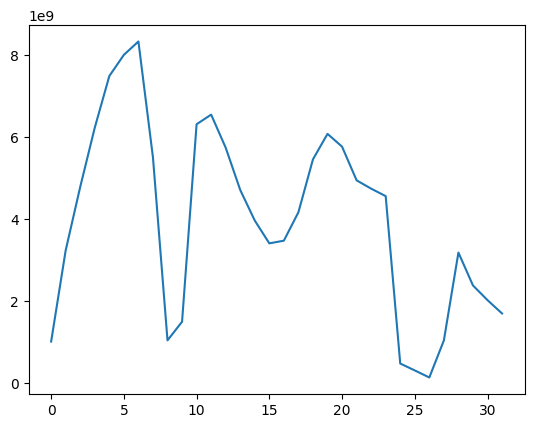

In [ ]:
Czi = czi.CziFile(r'\\crct-share.inserm.lan\CRCT22\99PoleTechno\LSM 980\2025.06.06_PI3K 18 well\MB231_Control-24h_5colorMIX-24h_02.czi')
img_tile = np.squeeze(Czi.read_image()[0])[2:34]
img_tile_int = np.mean(img_tile,(0,2,3))
img_tile = np.squeeze(img_tile[:,img_tile_int==img_tile_int.max(),])
for i in range(2,34):
    if i == 2:
        img = Czi.read_mosaic(C = i)
    else:
        img = np.concatenate([img,Czi.read_mosaic(C = i)],axis = 0)

plt.plot(img.sum((2,1)))

In [5]:
ch_range = np.asarray([
            [0,5],
            [5,10],
            [11,16],
            [16,21],
            [21,32],
            ])
for idx in range(ch_range.shape[0]):
    if idx == 0:
        img_tile_ch = np.sum(img_tile[ch_range[idx,0]:ch_range[idx,1]],0)[None,]
        img_ch = np.sum(img[ch_range[idx,0]:ch_range[idx,1]],0)[None,]
    else:
        tmp = np.sum(img[ch_range[idx,0]:ch_range[idx,1]],0)[None,]
        img_ch = np.concatenate([img_ch,tmp],axis = 0)
        tmp = np.sum(img_tile[ch_range[idx,0]:ch_range[idx,1]],0)[None,]
        img_tile_ch = np.concatenate([img_tile_ch,tmp],axis = 0)

In [6]:
mixed_downscaled = downscale_local_mean(img_tile_ch, (1, 8, 8))
mat_iters = compute_unmixing_matrix(
    mixed_downscaled, verbose=True, return_iters=True,
    max_iters=1000,
    step_mult=.1,
)
unmixing_matrix = mat_iters[-1]

unmixed = np.einsum('ij,jkl->ikl', unmixing_matrix, img_ch)
unmixed_tile = np.einsum('ij,jkl->ikl', unmixing_matrix, img_tile_ch)

Unmixing iterations: 248it [00:26,  9.48it/s]


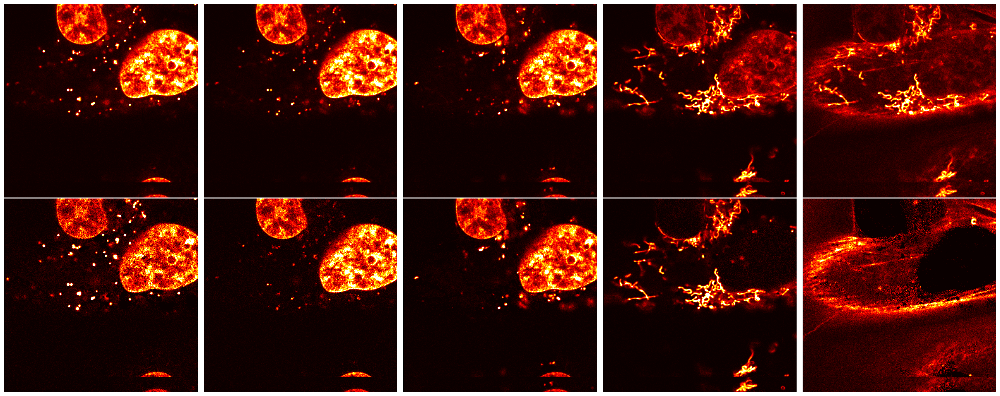

In [7]:
n_ch = img_ch.shape[0]
fig, ax = plt.subplots(2,n_ch,figsize = (n_ch*5,10),dpi =200)
for i in range(n_ch):
    ax[0,i].imshow(img_ch[i,:500,:500],vmin = 0,vmax = np.percentile(img_ch[i],99),cmap = 'hot')
    ax[1,i].imshow(unmixed[i,:500,:500],vmin = 0,vmax = np.percentile(unmixed[i],99),cmap = 'hot')
for axs in ax.ravel():
    axs.set_axis_off()
plt.tight_layout()

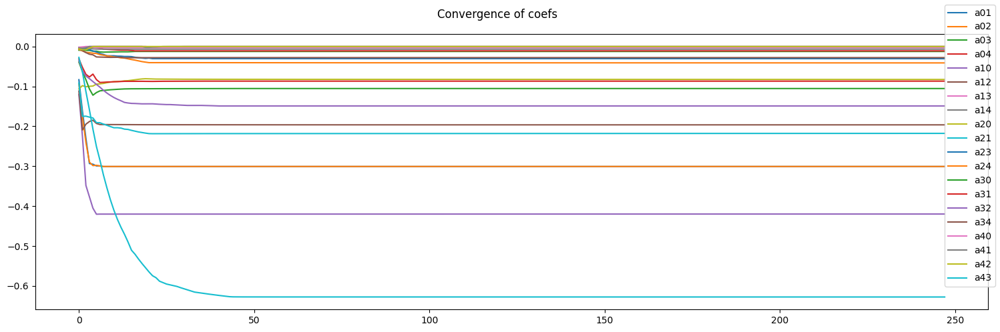

In [8]:
fig, ax = plt.subplots(figsize = (15,5))
fig: Figure
ax: Axes
x,y = mat_iters.shape[1:3]
for ix in range(x):
    for iy in range(y):
        if ix!=iy:
            ax.plot(mat_iters[:, ix, iy], label='a'+str(ix)+str(iy))
fig.legend()
fig.suptitle("Convergence of coefs")
fig.tight_layout()

In [9]:
n_iterations = 300
N_comp = 5
step_mult = 0.1

img_spectral = downscale_local_mean(img_tile, (1, 8, 8))
coord = list()
_,X,Y = img_spectral.shape
C = N_comp
img_int = np.repeat(img_spectral.sum(0)[None,],N_comp,axis=0)
for i in range(N_comp):
    if i % 2 == 0: 
        n_harmonic = (i // 2) + 1
        g, s, ph, m = lsf.PhasorTransform_Slow_3D(img_spectral, axis=0, n_harmonic=n_harmonic)
        coord.append(g)
    else: 
        coord.append(s)

coord = np.asarray(coord)
coord_guess = generate_equally_spaced_n_dim_points(N_comp)
coord_last = generate_equally_spaced_n_dim_points(N_comp)
coord_all = list()
for _ in tqdm(range(n_iterations)):
    for row in range(N_comp):
        for col in range(N_comp):
            if row == col:
                continue
            
            coef = minimize_mi_phasor(coord,img_int,coord_guess,(C,X,Y),row,col)
            coord_guess[row, col] = -step_mult * coef

    if np.allclose(coord_guess, coord_last):
        break
    coord_last = coord_guess.copy()
    coord_all.append(coord_last)

  0%|          | 0/300 [00:00<?, ?it/s]C:\Users\lorenzo.scipioni\AppData\Local\Temp\ipykernel_36608\1739209383.py:253: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  coord_guess[i,j] = alpha
100%|██████████| 300/300 [01:29<00:00,  3.36it/s]


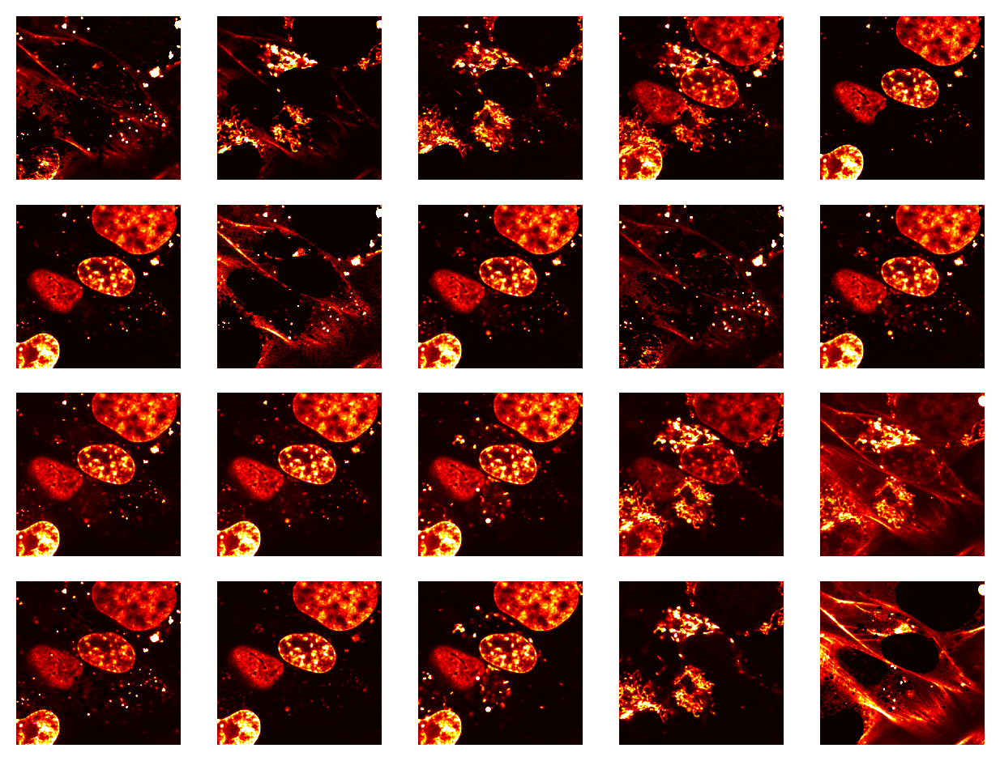

In [ ]:
coord = list()
_,X,Y = img_tile.shape
C = N_comp
img_int = np.repeat(img_tile.sum(0)[None,],N_comp,axis=0)
for i in range(N_comp):
    if i % 2 == 0: 
        n_harmonic = (i // 2) + 1
        g, s, ph, m = lsf.PhasorTransform_Slow_3D(img_tile, axis=0, n_harmonic=n_harmonic)
        coord.append(g)
    else: 
        coord.append(s)

coord = np.asarray(coord)

unmixed = unmix(coord, img_int, coord_guess, (C, X, Y))
unmixed0 = unmix(coord, img_int, generate_equally_spaced_n_dim_points(N_comp), (C, X, Y))

fig, ax = plt.subplots(4, N_comp, dpi=200)
vmax = np.percentile(unmixed, 99)
vmax0 = np.percentile(unmixed0, 99)
vmax_tile = np.percentile(unmixed_tile, 99)
for ch in range(N_comp):
    ax[0, ch].imshow(unmixed0[ch], cmap='hot', vmin=0, vmax=np.percentile(unmixed0[ch], 99))
    ax[1, ch].imshow(unmixed[ch], cmap='hot', vmin=0, vmax=np.percentile(unmixed[ch], 99))
    ax[2, ch].imshow(img_tile_ch[ch], cmap='hot', vmin=0, vmax=np.percentile(img_tile_ch[ch], 99))
    ax[3, ch].imshow(unmixed_tile[ch], cmap='hot', vmin=0, vmax=np.percentile(unmixed_tile[ch], 99))
    # ax[0, ch].set_title(f"Unmixed channel {ch} (optimized)")
    # ax[1, ch].set_title(f"Unmixed channel {ch} (initial guess)")
    # ax[2, ch].set_title(f"Unmixed_tile channel {ch}")

for axs in ax.ravel():
    axs.set_axis_off()
fig.tight_layout()


In [ ]:
import matplotlib.pyplot as plt

# Convert coord_all to numpy array if not already
coord_all_arr = np.array(coord_all)  # shape: (n_iter, N_comp, N_comp)

n_iter = coord_all_arr.shape[0]
n_comp = coord_all_arr.shape[1]
n_points = coord_all_arr.shape[2]

fig, axes = plt.subplots(n_comp, n_comp, figsize=(3*n_comp, 3*n_comp), squeeze=False)
for i in range(n_comp):
    for j in range(n_comp):
        if i == j:
            axes[i, j].axis('off')
            continue
        coord_i = coord_all_arr[:, i, :].flatten()
        coord_j = coord_all_arr[:, j, :].flatten()
        iteration_colors = np.repeat(np.arange(n_iter), n_points)
        sc = axes[i, j].scatter(coord_i, coord_j, c=iteration_colors, cmap='nipy_spectral', s=10)
        axes[i, j].set_xlabel(f'Coord {i}')
        axes[i, j].set_ylabel(f'Coord {j}')
        axes[i, j].set_title(f'{i} vs {j}')
fig.colorbar(sc, ax=axes, orientation='vertical', fraction=0.02, pad=0.01, label='Iteration')
fig.suptitle('All coordinate combinations (color = iteration)')
fig.tight_layout()
plt.show()